In [ ]:
from jetstream_hugo.jet_finding import *
from jetstream_hugo.definitions import *
from jetstream_hugo.plots import *
from jetstream_hugo.clustering import *
from jetstream_hugo.data import *
import colormaps

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [ ]:
exp_s = Experiment(
    "ERA5", "s", "6H", (1940, 2023), [5, 6, 7, 8, 9], -60, 70, 25, 85, 250, None, None, None
)
da_s = exp_s.da
exp_T = Experiment(
    "ERA5", "t", "6H", "all", "JJA", -60, 70, 25, 85, 250, 'hourofyear', {'hourofyear': ('win', 24 * 10)}, None,
)
da_T = exp_T.da
exp_s_low = Experiment(
    "ERA5", "s", "6H", (1940, 2023), [5, 6, 7, 8, 9], -60, 70, 25, 85, 700, None, None, None
)

In [ ]:
(
    all_jets,
    where_are_jets,
    all_jets_one_array,
    all_jets_over_time,
    flags,
) = exp_s.track_jets()
flags = xr.DataArray(flags, coords=dict(time=da_s.time.values, jet=np.arange(flags.shape[1])))
props_as_ds_uncat = exp_s.props_as_ds(categorize=False)
props_as_ds_uncat = better_is_polar(all_jets, props_as_ds_uncat, exp_s_low.path)
props_as_ds = categorize_ds_jets(props_as_ds_uncat)
props_as_np = props_to_np(props_as_ds)
props_as_ds_anoms = compute_prop_anomalies(props_as_ds)
props_as_ds['exists'] = (~props_as_ds['mean_lon'].isnull()).astype(np.float32)
ds_pvs, ds_pvs_anoms = open_pvs(da_s)
da_jet_pos = jet_position_as_da(da_s, props_as_ds, props_as_ds_uncat, all_jets,exp_s.path)

In [ ]:
from itertools import product
n = 3
quantiles = np.quantile(props_as_np, q=[.05, .95], axis=0)
props_as_np_digitized = np.zeros_like(props_as_np, dtype=int)
for i, prop_as_np in enumerate(props_as_np.T):
    props_as_np_digitized[:, i] = np.digitize(prop_as_np, quantiles[:, i])
titles = [', '.join(ouais) for ouais in product(props_as_ds.data_vars, props_as_ds.jet.values, ['bottom 5%', 'top 5%'])]

mask_extremes = np.zeros((props_as_np_digitized.shape[0], props_as_np_digitized.shape[1] * quantiles.shape[0]), dtype=bool)
for i, prop_as_np in enumerate(props_as_np_digitized.T):
    unique_labels = np.unique(prop_as_np)
    masks = prop_as_np[:, None] == unique_labels[None, :]
    for j in range(quantiles.shape[0] + 1):
        if j == 1 or j not in unique_labels:
            continue
        mask_extremes[:, i + props_as_np_digitized.shape[1] * int(j > 0)] = masks[:, unique_labels == j].squeeze()

## Wind speed

In [ ]:
to_plot_ws = []
baseline_s = da_s.mean(dim='time')
for i, prop_as_np in enumerate(props_as_np_digitized.T):
    centers = labels_to_centers(prop_as_np, da=da_s)
    for j in range(quantiles.shape[0] + 1):
        try:
            to_plot_ws.append(centers.sel(label=j))
        except Exception:
            to_plot_ws.append(centers[0].copy(data=np.zeros(centers.shape[1:])))
to_plot_ws_2 = [tplt for i, tplt in enumerate(to_plot_ws) if (i % 3) != 1]

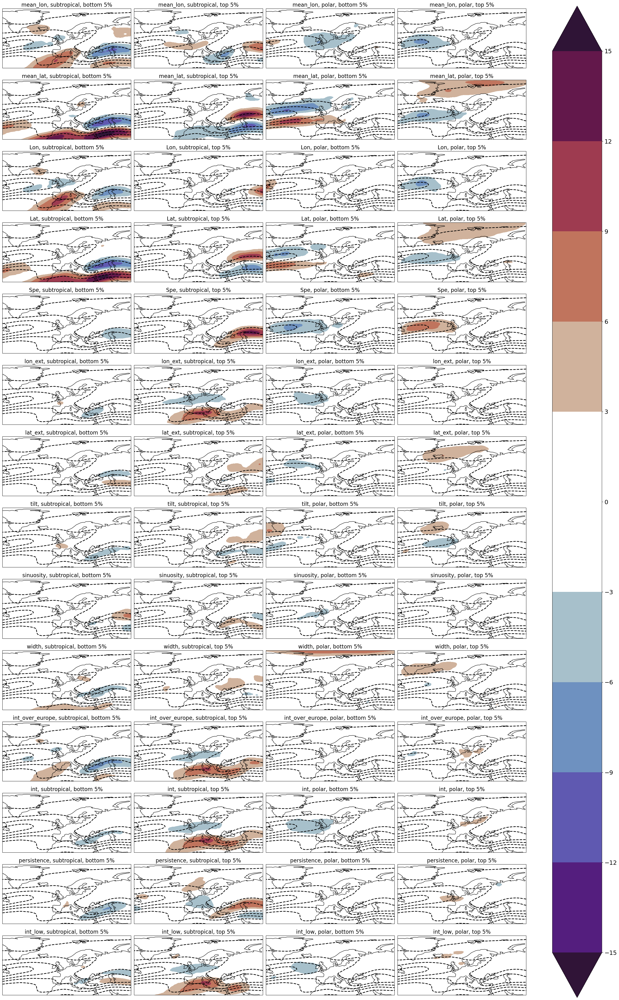

In [ ]:
clu = Clusterplot(len(props_as_ds.data_vars), 4, region=get_region(da_s))
_ = clu.add_contourf([tplt - baseline_s if tplt.mean() > 0 else tplt for tplt in to_plot_ws_2], cmap='twilight_shifted', transparify=1, nlevels=6, draw_cbar=True, q=0.999, titles=titles)
_ = clu.add_contour([baseline_s for _ in to_plot_ws_2], linestyles='dashed')
plt.savefig('/storage/homefs/hb22g102/persistent-extremes-era5/Figures/jet_index_extremes_composites/jet_index_vs_wind_speed.png')

## Temperature anomalies

100%|██████████| 56/56 [04:09<00:00,  4.46s/it]


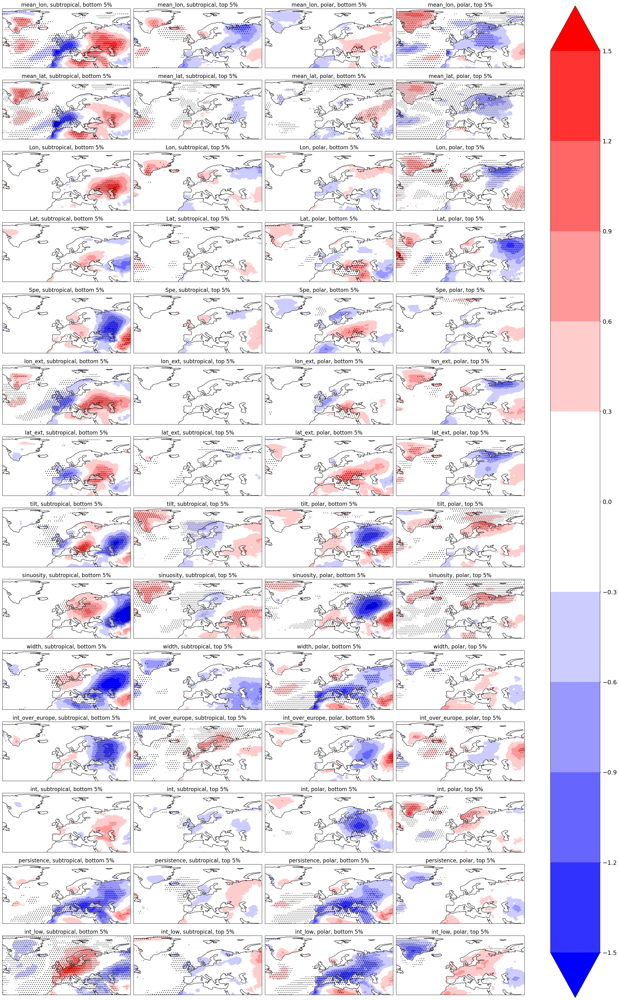

In [ ]:
clu = Clusterplot(len(props_as_ds.data_vars), 4, region=get_region(da_T))
_ = clu.add_any_contour_from_mask(da_T, mask_extremes, stippling=True, cmap='bwr', transparify=1, draw_cbar=True, titles=titles, q=0.999, nlevels=6)
plt.savefig('/storage/homefs/hb22g102/persistent-extremes-era5/Figures/jet_index_extremes_composites/jet_index_vs_temp.png')

## Jet position

100%|██████████| 56/56 [00:15<00:00,  3.51it/s]


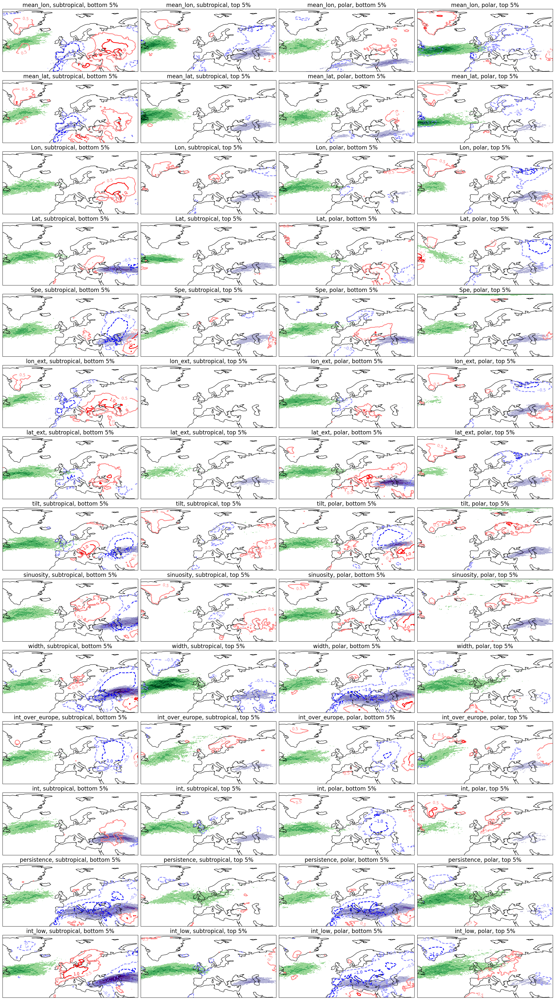

In [ ]:
clu = Clusterplot(len(props_as_ds.data_vars), 4, region=get_region(da_T))
_ = clu.add_any_contour_from_mask(da_T, mask_extremes, type='contour', cmap='bwr', clabels=True, nlevels=3, titles=titles)
clu.resize_relative([0.85, 0.95])
_ = clu.add_any_contour_from_mask(da_jet_pos[:, 0], mask_extremes, stippling=False, cmap='Purples', transparify=2, draw_cbar=False, q=0.999)
_ = clu.add_any_contour_from_mask(da_jet_pos[:, 1], mask_extremes, stippling=False, cmap='Greens', transparify=2, draw_cbar=False, q=0.999)
plt.savefig('/storage/homefs/hb22g102/persistent-extremes-era5/Figures/jet_index_extremes_composites/jet_index_vs_jet_pos.png')

## Anticyclonic streamers

  0%|          | 0/56 [00:00<?, ?it/s]

100%|██████████| 56/56 [06:07<00:00,  6.56s/it]


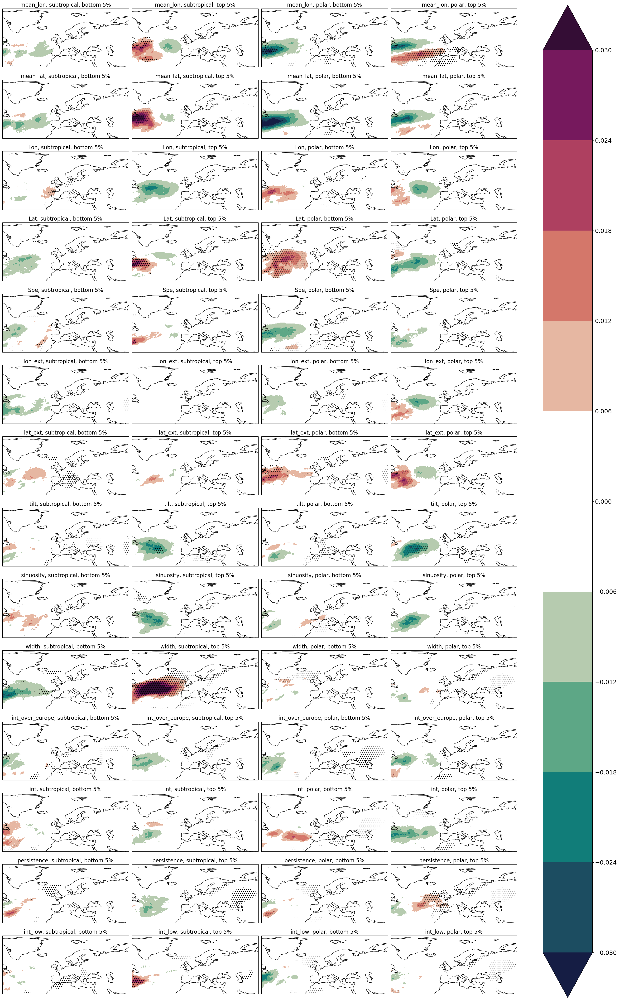

In [ ]:
import warnings
clu = Clusterplot(len(props_as_ds.data_vars), 4, region=get_region(ds_pvs_anoms['anti']))
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    _ = clu.add_any_contour_from_mask(ds_pvs_anoms['anti'], mask_extremes[6992:], stippling=True, cmap=colormaps.curl, transparify=1, draw_cbar=True, titles=titles, q=0.999, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/jet_index_vs_apvs.png')

## Cyclonic streamers

100%|██████████| 56/56 [05:56<00:00,  6.36s/it]


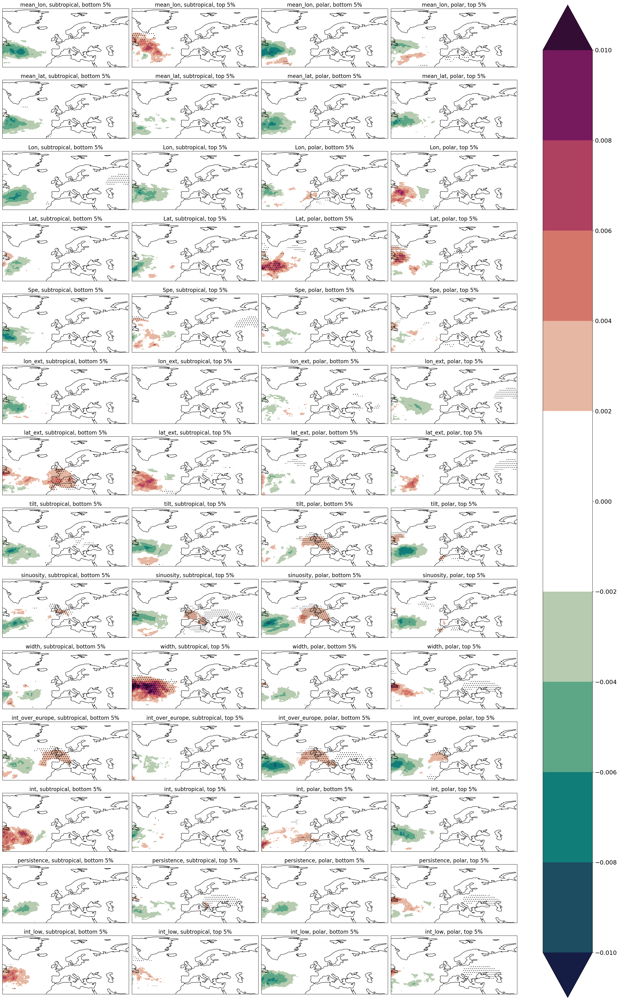

In [ ]:
clu = Clusterplot(len(props_as_ds.data_vars), 4, region=get_region(ds_pvs_anoms['cycl']))
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    _ = clu.add_any_contour_from_mask(ds_pvs_anoms['cycl'], mask_extremes[6992:], stippling=True, cmap=colormaps.curl, transparify=1, draw_cbar=True, titles=titles, q=0.999, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/cpvs.png')